In [1]:
import pandas as pd 
import os
import cv2
import random 
import numpy as np
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import layers, models, optimizers
import random
from tensorflow.keras.optimizers import Adagrad
from keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

In [2]:
# # Redimentionnement 

# from PIL import Image
# import os

# from PIL import Image
# import os

# def resize_images(input_folder, output_folder, target_size):
   
#     # Create the output folder if it doesn't exist
#     if not os.path.exists(output_folder):
#         os.makedirs(output_folder)

#     # Loop through each file in the input folder
#     for filename in os.listdir(input_folder):
#         # Check if the file is an image (you may need to adjust this check based on your image formats)
#         if filename.endswith((".jpg", ".png", ".jpeg")):
#             # Open the image file
#             with Image.open(os.path.join(input_folder, filename)) as img:
#                 # Resize the image
#                 img.thumbnail(target_size)
#                 # Save the resized image to the output folder
#                 img.save(os.path.join(output_folder, filename))



In [3]:
# target_size = (224, 224)
# resize_images("D:/ESTIA_COURS/Deeplearning/projet/Data/data/Treino/Chao","D:/ESTIA_COURS/Deeplearning/projet/Data/data/Treino/Chao2",target_size)
# resize_images("D:/ESTIA_COURS/Deeplearning/projet/Data/data/Treino/Ervas","D:/ESTIA_COURS/Deeplearning/projet/Data/data/Treino/Ervas2",target_size)
# resize_images("D:/ESTIA_COURS/Deeplearning/projet/Data/data/Treino/Milho","D:/ESTIA_COURS/Deeplearning/projet/Data/data/Treino/Milho2",target_size)

# resize_images("D:/ESTIA_COURS/Deeplearning/projet/Data/data/Teste/Chao","D:/ESTIA_COURS/Deeplearning/projet/Data/data/Teste/Chao2",target_size)
# resize_images("D:/ESTIA_COURS/Deeplearning/projet/Data/data/Teste/Ervas","D:/ESTIA_COURS/Deeplearning/projet/Data/data/Teste/Ervas2",target_size)
# resize_images("D:/ESTIA_COURS/Deeplearning/projet/Data/data/Teste/Milho","D:/ESTIA_COURS/Deeplearning/projet/Data/data/Teste/Milho2",target_size)

# resize_images("D:/ESTIA_COURS/Deeplearning/projet/Data/data/Validation/Chao","D:/ESTIA_COURS/Deeplearning/projet/Data/data/Validation/Chao2",target_size)
# resize_images("D:/ESTIA_COURS/Deeplearning/projet/Data/data/Validation/Ervas","D:/ESTIA_COURS/Deeplearning/projet/Data/data/Validation/Ervas2",target_size)
# resize_images("D:/ESTIA_COURS/Deeplearning/projet/Data/data/Validation/Milho","D:/ESTIA_COURS/Deeplearning/projet/Data/data/Validation/Milho2",target_size)


In [2]:
# Chemin vers les répertoires contenant les images

train_Chao = "D:/ESTIA_COURS/Deeplearning/projet/Data/data/Treino/Chao2"
train_Ervas = "D:/ESTIA_COURS/Deeplearning/projet/Data/data/Treino/Ervas2"
train_Milho = "D:/ESTIA_COURS/Deeplearning/projet/Data/data/Treino/Milho2"

test_Chao = "D:/ESTIA_COURS/Deeplearning/projet/Data/data/Teste/Chao2"
test_Ervas = "D:/ESTIA_COURS/Deeplearning/projet/Data/data/Teste/Ervas2"
test_Milho = "D:/ESTIA_COURS/Deeplearning/projet/Data/data/Teste/Milho2"

validation_Chao = "D:/ESTIA_COURS/Deeplearning/projet/Data/data/Validation/Chao2"
validation_Ervas = "D:/ESTIA_COURS/Deeplearning/projet/Data/data/Validation/Ervas2"
validation_Milho = "D:/ESTIA_COURS/Deeplearning/projet/Data/data/Validation/Milho2"


In [3]:

# Fonction pour charger et étiqueter les images
def load_images_and_labels(directory, label):
    data = []
    for filename in os.listdir(directory):
        if filename.endswith(".jpg") or filename.endswith(".png"):  # Vérifier si le fichier est une image
            img_path = os.path.join(directory, filename)
            img = cv2.imread(img_path)
            if img is not None:
                #img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                data.append((img, label))
    # Mélanger les données de manière aléatoire
    random.shuffle(data)
    # Sélectionner 25% des données
    sample_size = len(data) // 5
    sampled_data = data[:sample_size]
    return sampled_data

In [4]:
# Charger les images et les étiqueter pour chaque catégorie
Chao_data_train = load_images_and_labels(train_Chao,0)
Ervas_data_train = load_images_and_labels(train_Ervas,1)
Milho_data_train = load_images_and_labels(train_Milho,2)

Chao_data_test = load_images_and_labels(test_Chao,0)
Ervas_data_test = load_images_and_labels(test_Ervas, 1)
Milho_data_test = load_images_and_labels(test_Milho, 2)

Chao_data_val = load_images_and_labels(validation_Chao,0)
Ervas_data_val = load_images_and_labels(validation_Ervas,1)
Milho_data_val = load_images_and_labels(validation_Milho,2)

In [5]:
def Fusion(d1, d2, d3):
    # Fusionner les DataFrames
    resultat = d1+d2+d3
    return resultat

In [6]:
# Concaténer les données de toutes les catégories
data_train =Fusion(Chao_data_train,Ervas_data_train,Milho_data_train)

data_test = Fusion(Chao_data_test,Ervas_data_test,Milho_data_test)

data_validation = Fusion(Chao_data_val,Ervas_data_val,Milho_data_val)


In [7]:
# Convertir la liste de tuples en un DataFrame
df_train = pd.DataFrame(data_train, columns=["image", "label"])
train_data = df_train.sample(frac=1).reset_index(drop=True)
#train_data['label']=train_data['label'].map(encodage)

df_test = pd.DataFrame(data_test, columns=["image", "label"])
test_data = df_test.sample(frac=1).reset_index(drop=True)

df_validation = pd.DataFrame(data_validation, columns=["image", "label"])
validation_data = df_validation.sample(frac=1).reset_index(drop=True)

In [10]:

train_data.shape

(3680, 2)

In [11]:
train_data.dtypes

image    object
label     int64
dtype: object

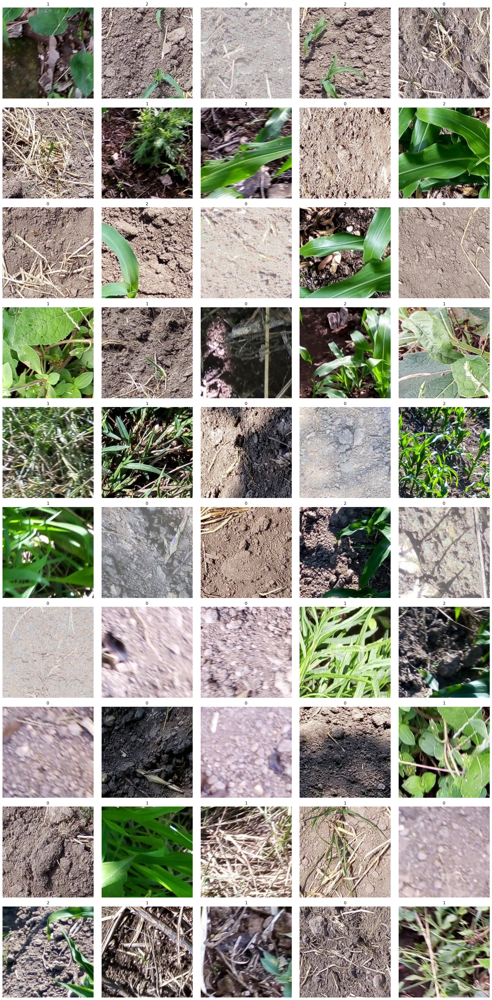

In [12]:
# Affichage 
import matplotlib.pyplot as plt

def plot_images_grid(df, num_rows, num_cols):
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 40))
    for i, ax in enumerate(axes.flat):
        img = df.iloc[i]["image"]
        label = df.iloc[i]["label"]
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.set_title(label)
        ax.axis("off")
    plt.tight_layout()
    plt.show()

# Utilisation
plot_images_grid(validation_data,10,5)

In [13]:
# Division des data 

In [8]:
# Convertir les images en tableaux numpy
X_train = np.array(train_data["image"].tolist())
X_test = np.array(test_data["image"].tolist())
X_val = np.array(validation_data["image"].tolist())

# Normaliser les valeurs de pixel des images
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0
X_val = X_val.astype('float32') / 255.0

# Encoder les étiquettes

y_train = train_data["label"]
y_test = test_data["label"]
y_val = validation_data["label"]

In [9]:
# Convertir les étiquettes encodées en valeurs one-hot
y_train = to_categorical(y_train,3)
y_test = to_categorical(y_test,3)
y_val = to_categorical(y_val,3)

In [16]:
# Creation du model 

In [17]:
# Couche partiellement connectées
model1 = Sequential()
model1.add(Conv2D(32, (7, 7), activation="relu", padding="same", input_shape=(224, 224, 3)))
model1.add(MaxPooling2D((2, 2)))

model1.add(Conv2D(64, (3, 3), activation="relu", padding="same"))
model1.add(MaxPooling2D((2, 2)))

model1.add(Conv2D(128, (3, 3), activation="relu", padding="same"))
model1.add(MaxPooling2D((2, 2)))

model1.add(Conv2D(256, (3, 3), activation="relu", padding="same"))
model1.add(MaxPooling2D((2, 2)))

# Couche integralement conectées 
model1.add(Flatten())

model1.add(Dense(256, activation="relu"))
model1.add(Dense(128, activation="relu"))
model1.add(Dense(64, activation="relu"))
model1.add(Dense(32, activation="relu"))

model1.add(Dense(3, activation="softmax"))

model1.summary()



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 32)      4736      
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 56, 56, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 28, 28, 128)      

In [18]:
from tensorflow.keras.models import  clone_model
model2 = clone_model(model1)
model3 = clone_model(model1)

In [19]:
# Utilisation de l'optimiseur  Adagrad
model1.compile( loss='categorical_crossentropy',optimizer = 'adagrad', metrics=['accuracy'])


In [20]:
# entrainement et evaluation 

# Entraîner le modèle avec l'optimiseur Adagrad
history_adagrad = model1.fit(X_train, y_train, epochs=10,validation_data=(X_val, y_val))

# Évaluer le modèle sur les données de test
test_loss_adagrad, test_accuracy_adagrad = model1.evaluate(X_test, y_test)
print(f"Test Accuracy (Adagrad): {test_accuracy_adagrad}")

Epoch 1/10


115/115 [==============================] - 105s 881ms/step - loss: 1.0619 - accuracy: 0.5019 - val_loss: 1.0084 - val_accuracy: 0.5087
Epoch 2/10
115/115 [==============================] - 99s 862ms/step - loss: 0.9612 - accuracy: 0.5274 - val_loss: 0.9041 - val_accuracy: 0.5062
Epoch 3/10
115/115 [==============================] - 99s 860ms/step - loss: 0.8544 - accuracy: 0.5571 - val_loss: 0.8565 - val_accuracy: 0.5112
Epoch 4/10
115/115 [==============================] - 102s 885ms/step - loss: 0.8052 - accuracy: 0.5728 - val_loss: 0.7819 - val_accuracy: 0.5736
Epoch 5/10
115/115 [==============================] - 98s 855ms/step - loss: 0.7749 - accuracy: 0.5899 - val_loss: 0.7224 - val_accuracy: 0.5935
Epoch 6/10
115/115 [==============================] - 98s 855ms/step - loss: 0.7642 - accuracy: 0.6117 - val_loss: 0.7096 - val_accuracy: 0.5935
Epoch 7/10
115/115 [==============================] - 99s 859ms/step - loss: 0.7254 - accuracy: 0.6258 - val_loss: 0.7169 - va

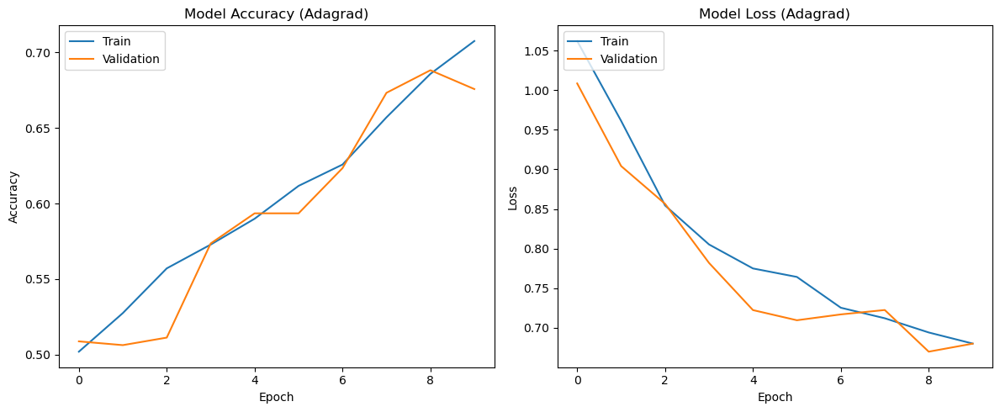

In [21]:
 # COURBE D'apprentissage 
    
import matplotlib.pyplot as plt

# Create subplots for accuracy and loss
plt.figure(figsize=(12, 5))

# Plot training & validation accuracy values (Adagrad)
plt.subplot(1, 2, 1)  
plt.plot(history_adagrad.history['accuracy'])
plt.plot(history_adagrad.history['val_accuracy'])
plt.title('Model Accuracy (Adagrad)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values (Adagrad)
plt.subplot(1, 2, 2)  
plt.plot(history_adagrad.history['loss'])
plt.plot(history_adagrad.history['val_loss'])
plt.title('Model Loss (Adagrad)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Show the plot
plt.tight_layout()  # Optional, to adjust subplot parameters to give specified padding.
plt.show()


In [20]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Fonction pour tracer la matrice de confusion
def plot_confusion_matrix(model, X_test, y_test):
    # Prédictions sur les données de test
    y_test1= y_test.copy()
    y_pred = np.argmax(model.predict(X_test), axis=-1)
    y_test1 = np.argmax((y_test1),axis=-1)
    # Calcul de la matrice de confusion
    cm = confusion_matrix(y_test1, y_pred)

    # Affichage de la matrice de confusion sous forme de heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.show()

2/2 [==============================] - 1s 171ms/step


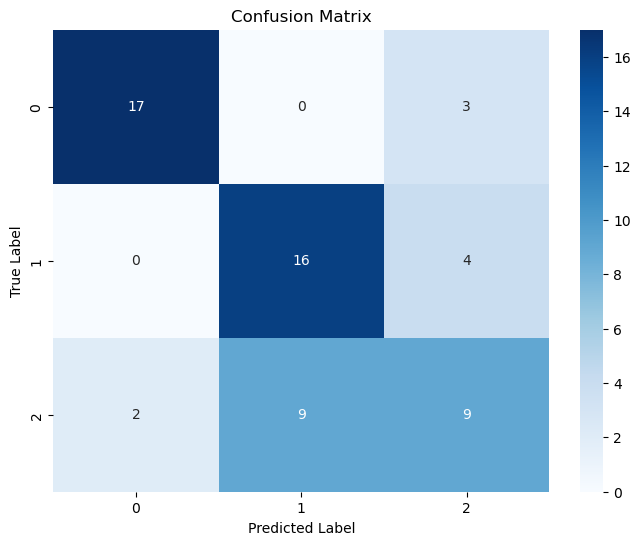

In [23]:
plot_confusion_matrix(model1, X_test, y_test)

In [24]:
# utilisation de l'optimiser RMSprop 
from tensorflow.keras.optimizers import RMSprop

model2.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

In [25]:
# entrainement et evaluation 

# Entraîner le modèle avec l'optimiseur Adagrad
history_rmsprop = model2.fit(X_train, y_train, epochs=10,validation_data=(X_val, y_val))

# Évaluer le modèle sur les données de test
test_loss_rmsprop, test_accuracy_rmsprop = model2.evaluate(X_test, y_test)
print(f"Test Accuracy (rmsprop): {test_accuracy_rmsprop}")

Epoch 1/10
115/115 [==============================] - 343s 3s/step - loss: 1.0901 - accuracy: 0.4266 - val_loss: 0.8218 - val_accuracy: 0.6185
Epoch 2/10
115/115 [==============================] - 87s 756ms/step - loss: 0.8476 - accuracy: 0.5962 - val_loss: 0.6926 - val_accuracy: 0.6509
Epoch 3/10
115/115 [==============================] - 94s 815ms/step - loss: 0.6705 - accuracy: 0.7027 - val_loss: 0.6623 - val_accuracy: 0.6309
Epoch 4/10
115/115 [==============================] - 101s 883ms/step - loss: 0.5680 - accuracy: 0.7671 - val_loss: 0.4486 - val_accuracy: 0.8180
Epoch 5/10
115/115 [==============================] - 101s 875ms/step - loss: 0.4872 - accuracy: 0.8019 - val_loss: 0.4421 - val_accuracy: 0.8379
Epoch 6/10
115/115 [==============================] - 99s 862ms/step - loss: 0.4181 - accuracy: 0.8410 - val_loss: 0.4553 - val_accuracy: 0.8055
Epoch 7/10
115/115 [==============================] - 99s 865ms/step - loss: 0.3535 - accuracy: 0.8674 - val_loss: 0.3993 - val_ac

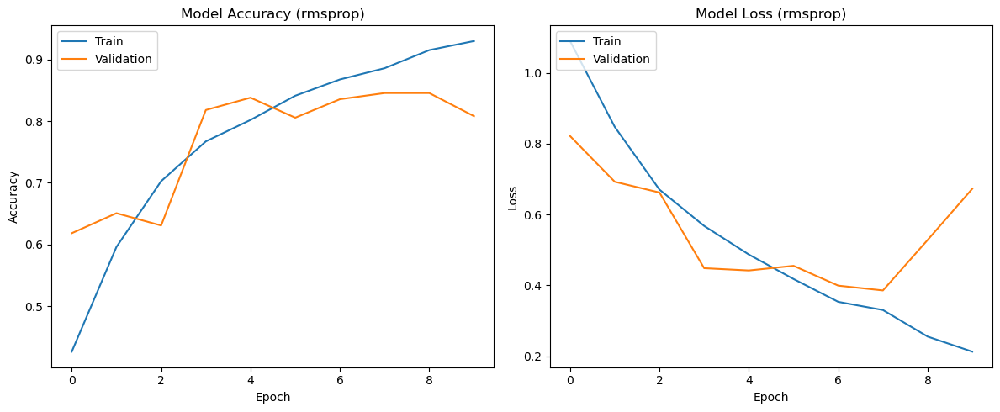

In [26]:
 # COURBE D'apprentissage 
    
import matplotlib.pyplot as plt

# Create subplots for accuracy and loss
plt.figure(figsize=(12, 5))

# Plot training & validation accuracy values (Adagrad)
plt.subplot(1, 2, 1)  
plt.plot(history_rmsprop.history['accuracy'])
plt.plot(history_rmsprop.history['val_accuracy'])
plt.title('Model Accuracy (rmsprop)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values (Adagrad)
plt.subplot(1, 2, 2)  
plt.plot(history_rmsprop.history['loss'])
plt.plot(history_rmsprop.history['val_loss'])
plt.title('Model Loss (rmsprop)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Show the plot
plt.tight_layout()  # Optional, to adjust subplot parameters to give specified padding.
plt.show()


2/2 [==============================] - 1s 181ms/step


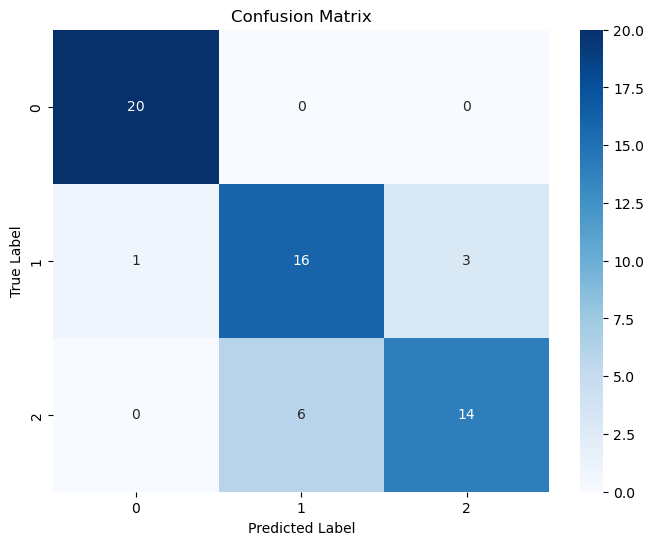

In [27]:
# Matrice de confusion 
plot_confusion_matrix(model2, X_test, y_test)

In [28]:
# utilisation de l'optimiser Adam 
from tensorflow.keras.optimizers import Adam

model3.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [29]:
# entrainement et evaluation 

# Entraîner le modèle avec l'optimiseur Adam
history_adam = model3.fit(X_train, y_train, epochs=10,validation_data=(X_val, y_val))

# Évaluer le modèle sur les données de test
test_loss_adam, test_accuracy_adam = model3.evaluate(X_test, y_test)
print(f"Test Accuracy (adam): {test_accuracy_adam}")

Epoch 1/10
115/115 [==============================] - 344s 3s/step - loss: 0.8589 - accuracy: 0.5780 - val_loss: 0.7419 - val_accuracy: 0.6434
Epoch 2/10
115/115 [==============================] - 203s 2s/step - loss: 0.5869 - accuracy: 0.7590 - val_loss: 0.5256 - val_accuracy: 0.7930
Epoch 3/10
115/115 [==============================] - 200s 2s/step - loss: 0.4512 - accuracy: 0.8274 - val_loss: 0.4734 - val_accuracy: 0.8304
Epoch 4/10
115/115 [==============================] - 210s 2s/step - loss: 0.3649 - accuracy: 0.8538 - val_loss: 0.3544 - val_accuracy: 0.8703
Epoch 5/10
115/115 [==============================] - 202s 2s/step - loss: 0.3339 - accuracy: 0.8701 - val_loss: 0.4104 - val_accuracy: 0.8354
Epoch 6/10
115/115 [==============================] - 202s 2s/step - loss: 0.2559 - accuracy: 0.9033 - val_loss: 0.3946 - val_accuracy: 0.8454
Epoch 7/10
115/115 [==============================] - 207s 2s/step - loss: 0.2392 - accuracy: 0.9098 - val_loss: 0.4912 - val_accuracy: 0.8404

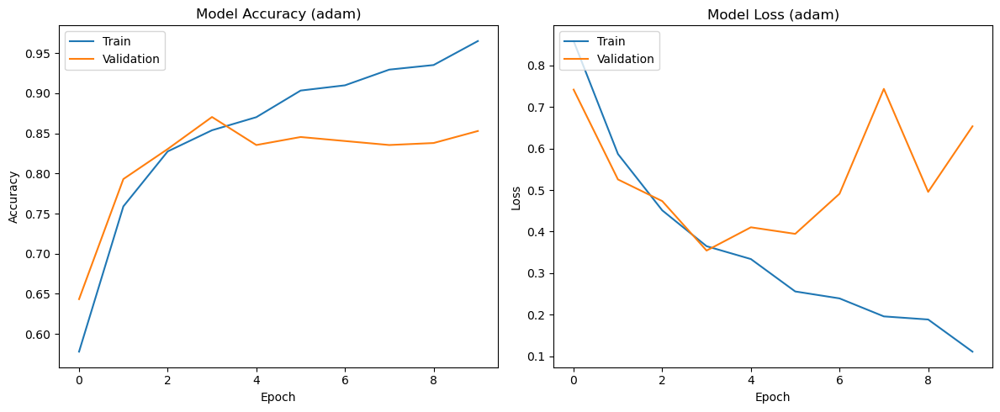

In [30]:
 # COURBE D'apprentissage 
    
import matplotlib.pyplot as plt

# Create subplots for accuracy and loss
plt.figure(figsize=(12, 5))

# Plot training & validation accuracy values (Adagrad)
plt.subplot(1, 2, 1)  
plt.plot(history_adam.history['accuracy'])
plt.plot(history_adam.history['val_accuracy'])
plt.title('Model Accuracy (adam)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values (Adagrad)
plt.subplot(1, 2, 2)  
plt.plot(history_adam.history['loss'])
plt.plot(history_adam.history['val_loss'])
plt.title('Model Loss (adam)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Show the plot
plt.tight_layout()
plt.show()


2/2 [==============================] - 2s 682ms/step


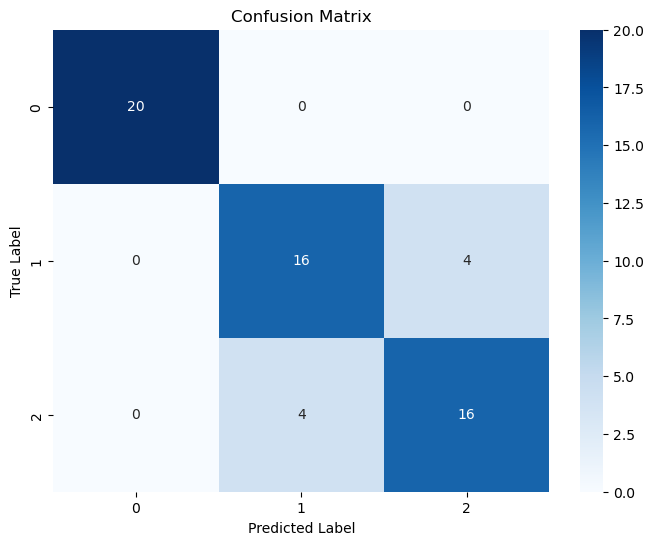

In [31]:
# Matrice de confusion 
plot_confusion_matrix(model3, X_test, y_test)

In [32]:
# expérimentations avec dropout en combinaison avec la normalisation par lots 


In [33]:
# taux de dropout = 0.25 et 0.50

In [34]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization

# Initialisation du modèle
model4 = Sequential()

# Couches convolutionnelles avec normalisation par lots
model4.add(Conv2D(32, (7, 7), activation="relu", padding="same", input_shape=(224, 224, 3)))
model4.add(BatchNormalization())
model4.add(MaxPooling2D((2, 2)))
model4.add(Dropout(0.25))  # Ajout d'une couche Dropout

model4.add(Conv2D(64, (3, 3), activation="relu", padding="same"))
model4.add(BatchNormalization())
model4.add(MaxPooling2D((2, 2)))
model4.add(Dropout(0.25))  # Ajout d'une couche Dropout

model4.add(Conv2D(128, (3, 3), activation="relu", padding="same"))
model4.add(BatchNormalization())
model4.add(MaxPooling2D((2, 2)))
model4.add(Dropout(0.25))  # Ajout d'une couche Dropout

# Couche intégralement connectée
model4.add(Flatten())

model4.add(Dense(128, activation="relu"))
model4.add(BatchNormalization())
model4.add(Dropout(0.5))  # Ajout d'une couche Dropout

model4.add(Dense(64, activation="relu"))
model4.add(BatchNormalization())
model4.add(Dropout(0.5))  # Ajout d'une couche Dropout

model4.add(Dense(32, activation="relu"))
model4.add(BatchNormalization())
model4.add(Dropout(0.5))  # Ajout d'une couche Dropout

# Couche de sortie
model4.add(Dense(3, activation="softmax"))

# Résumé du modèle
model4.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 224, 224, 32)      4736      
                                                                 
 batch_normalization (Batch  (None, 224, 224, 32)      128       
 Normalization)                                                  
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 112, 112, 32)      0         
 g2D)                                                            
                                                                 
 dropout (Dropout)           (None, 112, 112, 32)      0         
                                                                 
 conv2d_5 (Conv2D)           (None, 112, 112, 64)      18496     
                                                                 
 batch_normalization_1 (Bat  (None, 112, 112, 64)     

In [35]:
model4.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [36]:
# entrainement et evaluation 

# Entraîner le modèle avec l'optimiseur Adam
history_adam = model4.fit(X_train, y_train, epochs=10,validation_data=(X_val, y_val))

# Évaluer le modèle sur les données de test
test_loss_adam, test_accuracy_adam = model4.evaluate(X_test, y_test)
print(f"Test Accuracy (adam): {test_accuracy_adam}")

Epoch 1/10
115/115 [==============================] - 243s 2s/step - loss: 1.1766 - accuracy: 0.5141 - val_loss: 2.1361 - val_accuracy: 0.3217
Epoch 2/10
115/115 [==============================] - 223s 2s/step - loss: 0.8541 - accuracy: 0.6443 - val_loss: 1.0024 - val_accuracy: 0.5611
Epoch 3/10
115/115 [==============================] - 219s 2s/step - loss: 0.7478 - accuracy: 0.6785 - val_loss: 0.9606 - val_accuracy: 0.5835
Epoch 4/10
115/115 [==============================] - 217s 2s/step - loss: 0.6856 - accuracy: 0.7245 - val_loss: 0.8656 - val_accuracy: 0.6035
Epoch 5/10
115/115 [==============================] - 218s 2s/step - loss: 0.6417 - accuracy: 0.7454 - val_loss: 0.8780 - val_accuracy: 0.6758
Epoch 6/10
115/115 [==============================] - 226s 2s/step - loss: 0.5832 - accuracy: 0.7717 - val_loss: 0.7087 - val_accuracy: 0.6808
Epoch 7/10
115/115 [==============================] - 215s 2s/step - loss: 0.5729 - accuracy: 0.7886 - val_loss: 0.6801 - val_accuracy: 0.7581

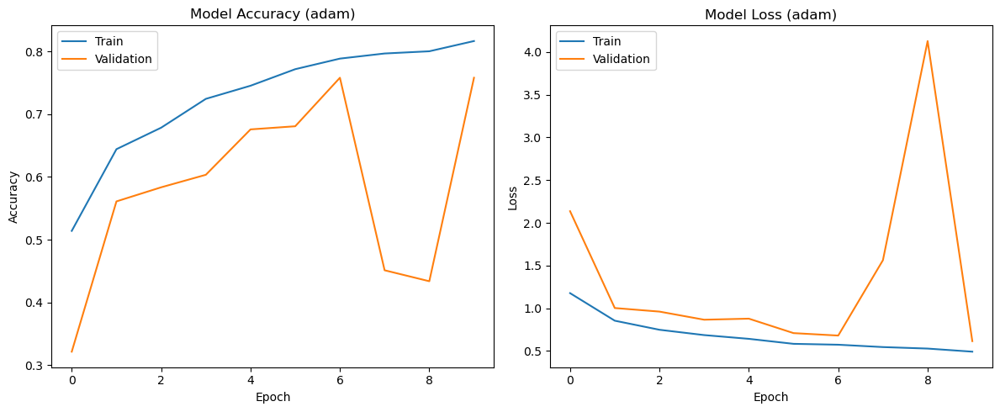

In [37]:
 # COURBE D'apprentissage 
    
import matplotlib.pyplot as plt

# Create subplots for accuracy and loss
plt.figure(figsize=(12, 5))

# Plot training & validation accuracy values (Adagrad)
plt.subplot(1, 2, 1)  
plt.plot(history_adam.history['accuracy'])
plt.plot(history_adam.history['val_accuracy'])
plt.title('Model Accuracy (adam)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values (Adagrad)
plt.subplot(1, 2, 2)  
plt.plot(history_adam.history['loss'])
plt.plot(history_adam.history['val_loss'])
plt.title('Model Loss (adam)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Show the plot
plt.tight_layout()  # Optional, to adjust subplot parameters to give specified padding.
plt.show()


2/2 [==============================] - 2s 398ms/step


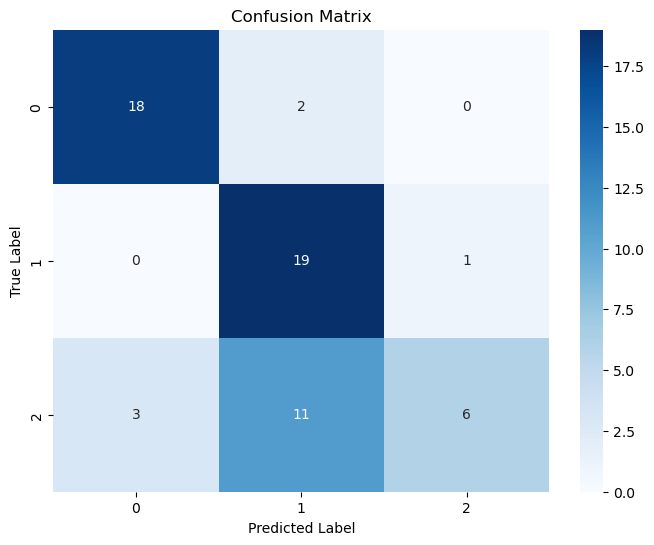

In [38]:
# Matrice de confusion 
plot_confusion_matrix(model4, X_test, y_test)

In [39]:
# taux de dropout = 0.3

In [40]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization

# Initialisation du modèle
model5 = Sequential()

# Couches convolutionnelles avec normalisation par lots
model5.add(Conv2D(32, (7, 7), activation="relu", padding="same", input_shape=(224, 224, 3)))
model5.add(BatchNormalization())
model5.add(MaxPooling2D((2, 2)))
model5.add(Dropout(0.30))  # Ajout d'une couche Dropout

model5.add(Conv2D(64, (3, 3), activation="relu", padding="same"))
model5.add(BatchNormalization())
model5.add(MaxPooling2D((2, 2)))
model5.add(Dropout(0.30))  # Ajout d'une couche Dropout

model5.add(Conv2D(128, (3, 3), activation="relu", padding="same"))
model5.add(BatchNormalization())
model5.add(MaxPooling2D((2, 2)))
model5.add(Dropout(0.30))  # Ajout d'une couche Dropout



# Couche intégralement connectée
model5.add(Flatten())

model5.add(Dense(128, activation="relu"))
model5.add(BatchNormalization())
model5.add(Dropout(0.30))  # Ajout d'une couche Dropout

model5.add(Dense(64, activation="relu"))
model5.add(BatchNormalization())
model5.add(Dropout(0.3))  # Ajout d'une couche Dropout

model5.add(Dense(32, activation="relu"))
model5.add(BatchNormalization())
model5.add(Dropout(0.3))  # Ajout d'une couche Dropout


# Couche de sortie
model5.add(Dense(3, activation="softmax"))

# Résumé du modèle
model5.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 224, 224, 32)      4736      
                                                                 
 batch_normalization_6 (Bat  (None, 224, 224, 32)      128       
 chNormalization)                                                
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 112, 112, 32)      0         
 g2D)                                                            
                                                                 
 dropout_6 (Dropout)         (None, 112, 112, 32)      0         
                                                                 
 conv2d_8 (Conv2D)           (None, 112, 112, 64)      18496     
                                                                 
 batch_normalization_7 (Bat  (None, 112, 112, 64)     

In [41]:
model5.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [42]:
# entrainement et evaluation 

# Entraîner le modèle avec l'optimiseur Adam
history_adam = model5.fit(X_train, y_train, epochs=10,validation_data=(X_val, y_val))

# Évaluer le modèle sur les données de test
test_loss_adam, test_accuracy_adam = model5.evaluate(X_test, y_test)
print(f"Test Accuracy (adam): {test_accuracy_adam}")

Epoch 1/10
115/115 [==============================] - 246s 2s/step - loss: 1.0332 - accuracy: 0.5345 - val_loss: 1.1149 - val_accuracy: 0.3392
Epoch 2/10
115/115 [==============================] - 220s 2s/step - loss: 0.9160 - accuracy: 0.5590 - val_loss: 0.9043 - val_accuracy: 0.5262
Epoch 3/10
115/115 [==============================] - 217s 2s/step - loss: 0.7394 - accuracy: 0.6655 - val_loss: 1.3141 - val_accuracy: 0.4564
Epoch 4/10
115/115 [==============================] - 218s 2s/step - loss: 0.6542 - accuracy: 0.7152 - val_loss: 0.9616 - val_accuracy: 0.5935
Epoch 5/10
115/115 [==============================] - 214s 2s/step - loss: 0.5841 - accuracy: 0.7633 - val_loss: 1.2527 - val_accuracy: 0.4065
Epoch 6/10
115/115 [==============================] - 215s 2s/step - loss: 0.5076 - accuracy: 0.8041 - val_loss: 4.8239 - val_accuracy: 0.3317
Epoch 7/10
115/115 [==============================] - 224s 2s/step - loss: 0.4666 - accuracy: 0.8130 - val_loss: 0.6499 - val_accuracy: 0.6958

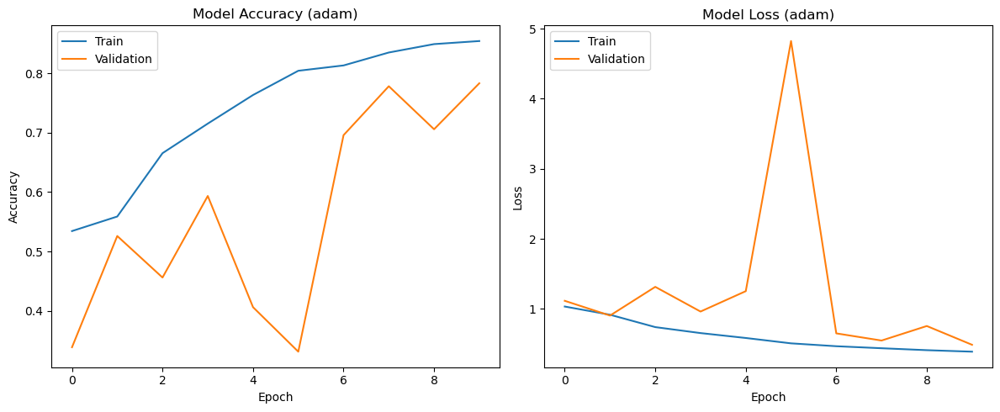

In [43]:
 # COURBE D'apprentissage 
    
import matplotlib.pyplot as plt

# Create subplots for accuracy and loss
plt.figure(figsize=(12, 5))

# Plot training & validation accuracy values (Adagrad)
plt.subplot(1, 2, 1)  
plt.plot(history_adam.history['accuracy'])
plt.plot(history_adam.history['val_accuracy'])
plt.title('Model Accuracy (adam)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values (Adagrad)
plt.subplot(1, 2, 2)  
plt.plot(history_adam.history['loss'])
plt.plot(history_adam.history['val_loss'])
plt.title('Model Loss (adam)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Show the plot
plt.tight_layout()  # Optional, to adjust subplot parameters to give specified padding.
plt.show()


2/2 [==============================] - 2s 450ms/step


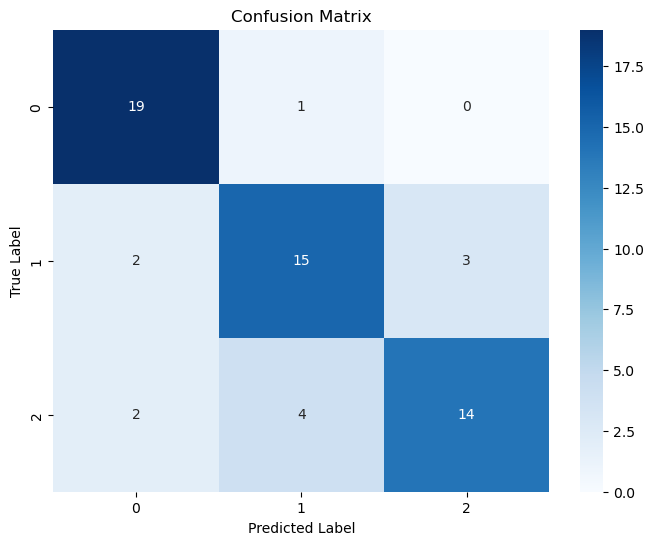

In [44]:
# Matrice de confusion 
plot_confusion_matrix(model5, X_test, y_test)

In [45]:
# Les Modèls préentranné

In [46]:
#  VGG16

In [15]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model

In [48]:
vgg_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [49]:
x = vgg_model.output
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(512, activation='relu')(x)
predictions = tf.keras.layers.Dense(3, activation='softmax')(x) # Modifier "num_classes" selon votre tâche

# Créer un modèle final
model6 = Model(inputs=vgg_model.input, outputs=predictions)

In [50]:
model6.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [51]:
model6.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
# Entraînement du modèle
history_vgg16=model6.fit(X_train, y_train, epochs=5, batch_size=32, validation_data=(X_val, y_val))
test_loss_adam, test_accuracy_adam = model6.evaluate(X_test, y_test)
print(f"Test Accuracy (adam): {test_accuracy_adam}")

Epoch 1/5
115/115 [==============================] - 3070s 27s/step - loss: 2.6272 - accuracy: 0.4435 - val_loss: 0.8363 - val_accuracy: 0.6209
Epoch 2/5
115/115 [==============================] - 1453s 13s/step - loss: 0.7563 - accuracy: 0.6367 - val_loss: 0.7477 - val_accuracy: 0.6509
Epoch 3/5
115/115 [==============================] - 1462s 13s/step - loss: 1.0706 - accuracy: 0.4617 - val_loss: 1.0368 - val_accuracy: 0.3466
Epoch 4/5
115/115 [==============================] - 1458s 13s/step - loss: 1.1031 - accuracy: 0.3334 - val_loss: 1.0984 - val_accuracy: 0.3317
Epoch 5/5
2/2 [==============================] - 15s 7s/step - loss: 1.0987 - accuracy: 0.3333
Test Accuracy (adam): 0.3333333432674408


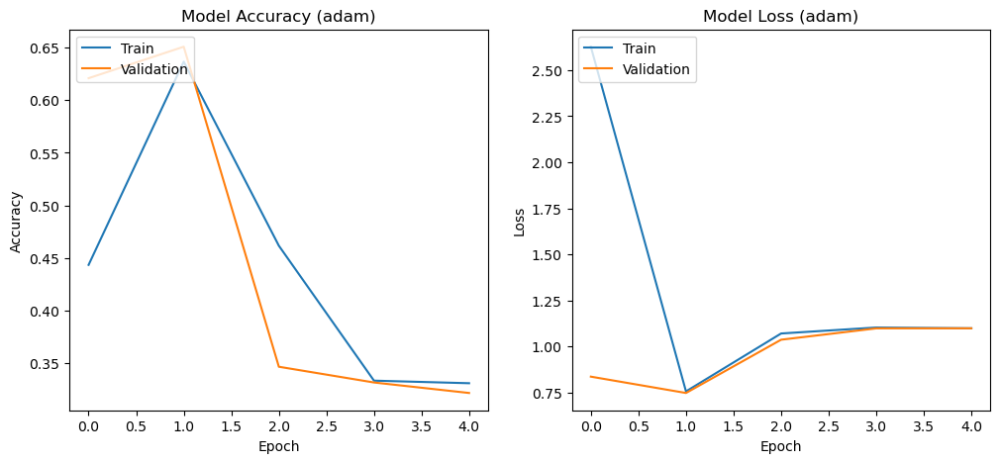

In [52]:
 # COURBE D'apprentissage 
    
import matplotlib.pyplot as plt

# Create subplots for accuracy and loss
plt.figure(figsize=(12, 5))

# Plot training & validation accuracy values (Adagrad)
plt.subplot(1, 2, 1)  
plt.plot(history_vgg16.history['accuracy'])
plt.plot(history_vgg16.history['val_accuracy'])
plt.title('Model Accuracy (adam)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values (Adagrad)
plt.subplot(1, 2, 2)  
plt.plot(history_vgg16.history['loss'])
plt.plot(history_vgg16.history['val_loss'])
plt.title('Model Loss (adam)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Show the plot
plt.show()


2/2 [==============================] - 17s 7s/step


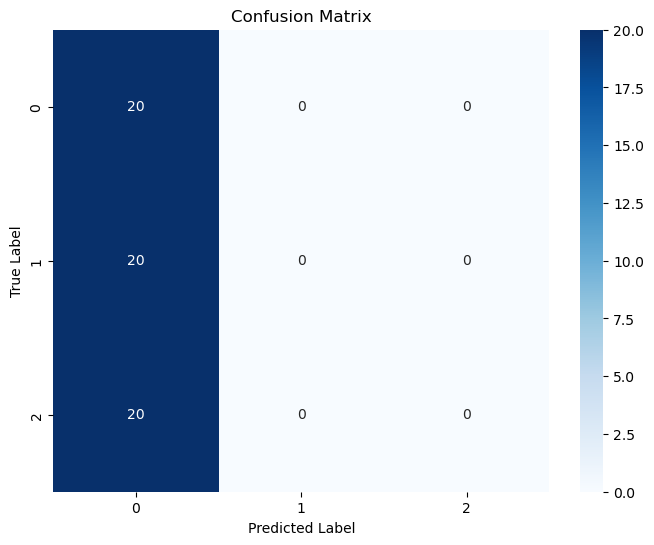

In [53]:
plot_confusion_matrix(model6, X_test, y_test)

In [54]:
# le model VGG19

In [55]:
from tensorflow.keras.applications import VGG19

In [56]:
vgg_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [57]:
x = vgg_model.output
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(512, activation='relu')(x)
predictions = tf.keras.layers.Dense(3, activation='softmax')(x) # Modifier "num_classes" selon votre tâche

# Créer un modèle final
model7 = Model(inputs=vgg_model.input, outputs=predictions)

In [58]:
model7.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
# Entraînement du modèle
history_vgg19=model7.fit(X_train, y_train, epochs=5, batch_size=32, validation_data=(X_val, y_val))
test_loss_adam, test_accuracy_adam = model7.evaluate(X_test, y_test)
print(f"Test Accuracy (adam): {test_accuracy_adam}")

Epoch 1/5
115/115 [==============================] - 3986s 35s/step - loss: 7.6859 - accuracy: 0.3345 - val_loss: 1.0988 - val_accuracy: 0.3217
Epoch 2/5
115/115 [==============================] - 3710s 32s/step - loss: 1.0986 - accuracy: 0.3253 - val_loss: 1.0986 - val_accuracy: 0.3466
Epoch 3/5
115/115 [==============================] - 1838s 16s/step - loss: 1.0986 - accuracy: 0.3399 - val_loss: 1.0985 - val_accuracy: 0.3466
Epoch 4/5
115/115 [==============================] - 1838s 16s/step - loss: 1.0987 - accuracy: 0.3399 - val_loss: 1.0985 - val_accuracy: 0.3466
Epoch 5/5
2/2 [==============================] - 10s 4s/step - loss: 1.0987 - accuracy: 0.3333
Test Accuracy (adam): 0.3333333432674408


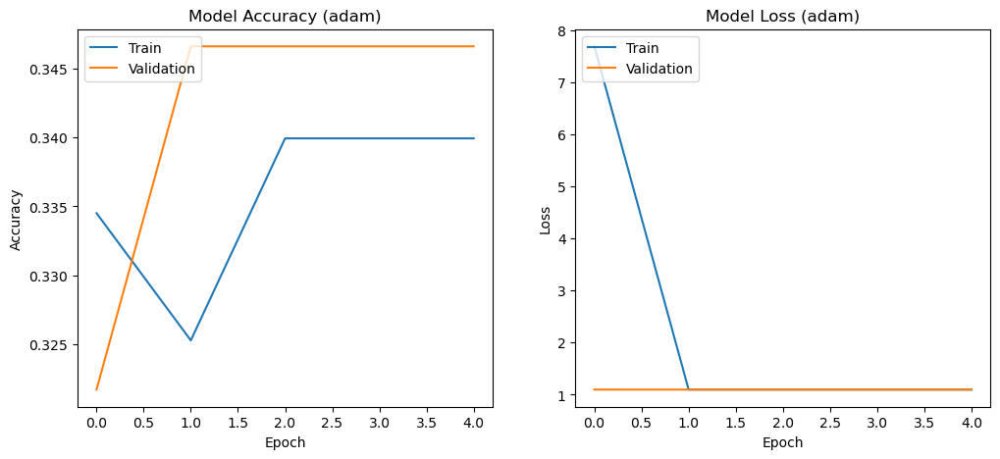

In [59]:
 # COURBE D'apprentissage 
    
import matplotlib.pyplot as plt

# Create subplots for accuracy and loss
plt.figure(figsize=(12, 5))

# Plot training & validation accuracy values (Adagrad)
plt.subplot(1, 2, 1)  
plt.plot(history_vgg19.history['accuracy'])
plt.plot(history_vgg19.history['val_accuracy'])
plt.title('Model Accuracy (adam)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values (Adagrad)
plt.subplot(1, 2, 2)  
plt.plot(history_vgg19.history['loss'])
plt.plot(history_vgg19.history['val_loss'])
plt.title('Model Loss (adam)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Show the plot
plt.show()


2/2 [==============================] - 10s 5s/step


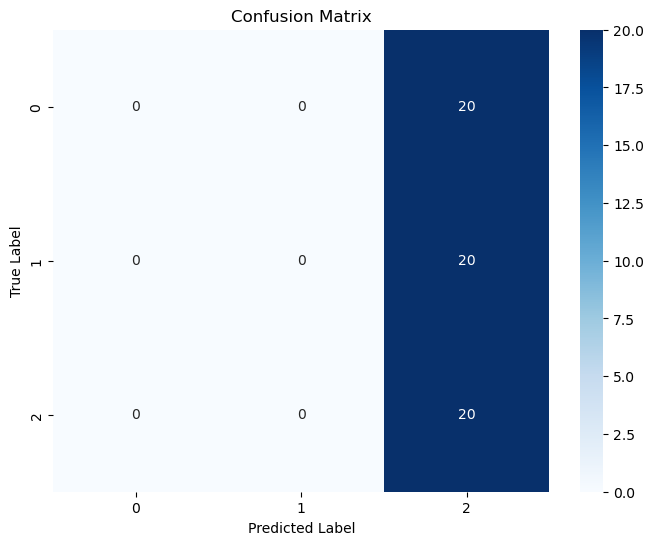

In [60]:
# Matrice de confusion 
plot_confusion_matrix(model7, X_test, y_test)

In [61]:
# Model Xception 

In [11]:
from tensorflow.keras.applications import Xception

In [63]:
xception_model = Xception(weights=None, include_top=False, input_shape=(224, 224, 3))

In [64]:
x = xception_model.output
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(512, activation='relu')(x)
predictions = tf.keras.layers.Dense(3, activation='softmax')(x) # Modifier "num_classes" selon votre tâche

# Créer un modèle final
model8 = Model(inputs=xception_model.input, outputs=predictions)

In [65]:
model8.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
# Entraînement du modèle
history_xception=model8.fit(X_train, y_train, epochs=5, batch_size=32, validation_data=(X_val, y_val))
test_loss_adam, test_accuracy_adam = model8.evaluate(X_test, y_test)
print(f"Test Accuracy (adam): {test_accuracy_adam}")

Epoch 1/5
115/115 [==============================] - 2126s 18s/step - loss: 2.7298 - accuracy: 0.6024 - val_loss: 1.0986 - val_accuracy: 0.3317
Epoch 2/5
115/115 [==============================] - 2225s 19s/step - loss: 0.5230 - accuracy: 0.7872 - val_loss: 1.0987 - val_accuracy: 0.3217
Epoch 3/5
115/115 [==============================] - 2255s 20s/step - loss: 0.4221 - accuracy: 0.8410 - val_loss: 1.0979 - val_accuracy: 0.3242
Epoch 4/5
115/115 [==============================] - 2297s 20s/step - loss: 0.3665 - accuracy: 0.8571 - val_loss: 1.0766 - val_accuracy: 0.4165
Epoch 5/5
2/2 [==============================] - 4s 2s/step - loss: 0.8199 - accuracy: 0.6667
Test Accuracy (adam): 0.6666666865348816


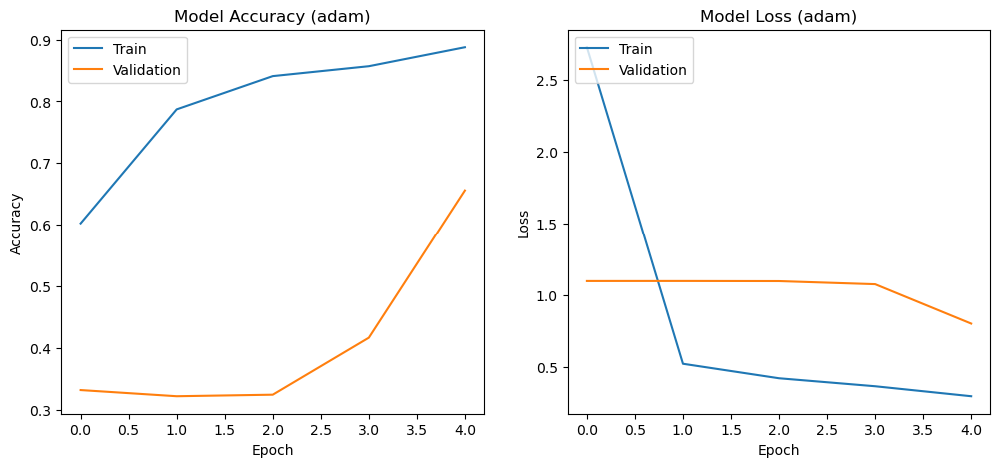

In [66]:
 # COURBE D'apprentissage 
    
import matplotlib.pyplot as plt

# Create subplots for accuracy and loss
plt.figure(figsize=(12, 5))

# Plot training & validation accuracy values (Adagrad)
plt.subplot(1, 2, 1)  
plt.plot(history_xception.history['accuracy'])
plt.plot(history_xception.history['val_accuracy'])
plt.title('Model Accuracy (adam)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values (Adagrad)
plt.subplot(1, 2, 2)  
plt.plot(history_xception.history['loss'])
plt.plot(history_xception.history['val_loss'])
plt.title('Model Loss (adam)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Show the plot
plt.show()


2/2 [==============================] - 5s 2s/step


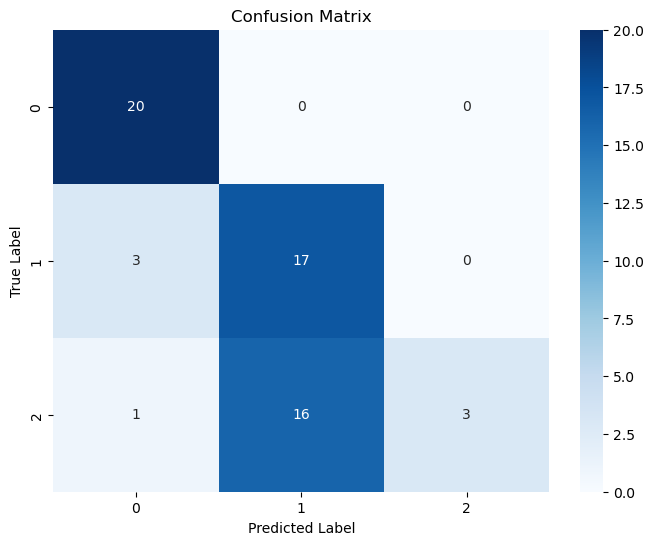

In [67]:
# Matrice de confusion 
plot_confusion_matrix(model8, X_test, y_test)

In [68]:
# Model Xception avec les poids de la partie premtrainné geler 

In [12]:
xception_model2 = Xception(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [13]:
# Geler les poids des couches pré-entraînées
for layer in xception_model2.layers:
    layer.trainable = False

In [16]:
x = xception_model2.output
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(256, activation='relu')(x)
predictions = tf.keras.layers.Dense(3, activation='softmax')(x) 
model9 = Model(inputs=xception_model2.input, outputs=predictions)

In [17]:
model9.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
# Entraînement du modèle
history_xception2=model9.fit(X_train, y_train, epochs=5, batch_size=32, validation_data=(X_val, y_val))
test_loss_adam, test_accuracy_adam = model9.evaluate(X_test, y_test)
print(f"Test Accuracy (adam): {test_accuracy_adam}")



Epoch 1/5


115/115 [==============================] - 421s 4s/step - loss: 1.2049 - accuracy: 0.8310 - val_loss: 0.2969 - val_accuracy: 0.8828
Epoch 2/5
115/115 [==============================] - 403s 4s/step - loss: 0.1828 - accuracy: 0.9386 - val_loss: 0.4160 - val_accuracy: 0.8828
Epoch 3/5
115/115 [==============================] - 408s 4s/step - loss: 0.0851 - accuracy: 0.9696 - val_loss: 0.2881 - val_accuracy: 0.9077
Epoch 4/5
115/115 [==============================] - 401s 3s/step - loss: 0.0341 - accuracy: 0.9899 - val_loss: 0.3898 - val_accuracy: 0.9002
Epoch 5/5
2/2 [==============================] - 5s 2s/step - loss: 0.1531 - accuracy: 0.9500
Test Accuracy (adam): 0.949999988079071


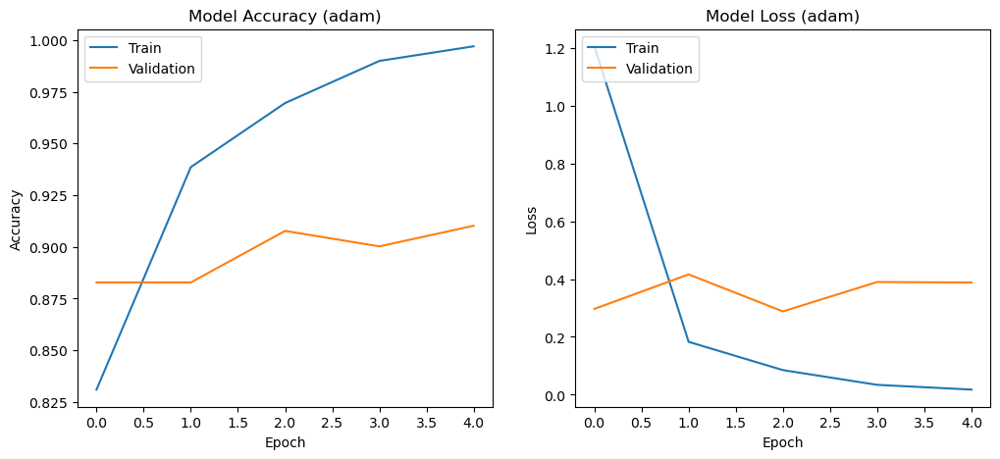

In [18]:
 # COURBE D'apprentissage 
    
import matplotlib.pyplot as plt

# Create subplots for accuracy and loss
plt.figure(figsize=(12, 5))

# Plot training & validation accuracy values (Adagrad)
plt.subplot(1, 2, 1)  
plt.plot(history_xception2.history['accuracy'])
plt.plot(history_xception2.history['val_accuracy'])
plt.title('Model Accuracy (adam)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values (Adagrad)
plt.subplot(1, 2, 2)  
plt.plot(history_xception2.history['loss'])
plt.plot(history_xception2.history['val_loss'])
plt.title('Model Loss (adam)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Show the plot
plt.show()


2/2 [==============================] - 8s 2s/step


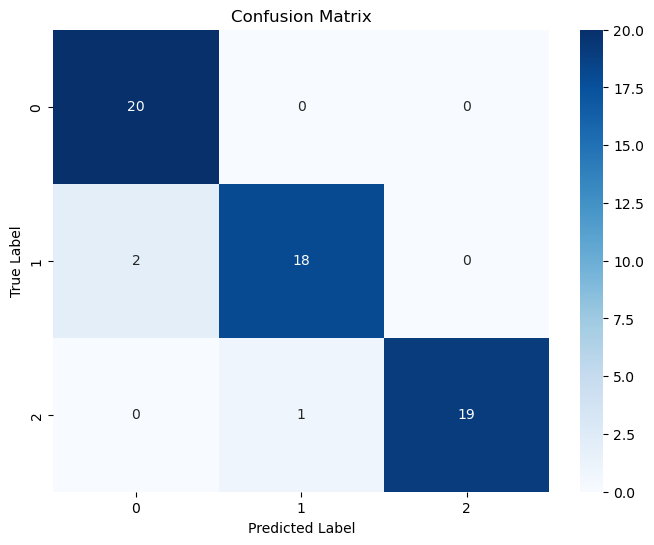

In [21]:
plot_confusion_matrix(model9, X_test, y_test)

In [ ]:
# Affichez les images et la probabilité correspondant à la classe 

1/1 [==============================] - 0s 401ms/step


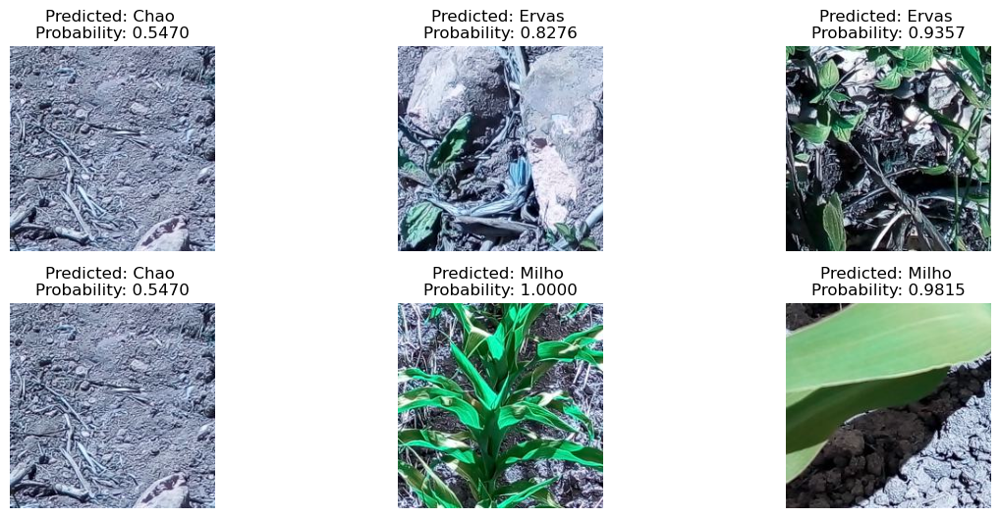

In [36]:
import numpy as np
import matplotlib.pyplot as plt

# Sélectionner quelques images de chaque classe à partir des données de test
num_images_per_class = 3  # Nombre d'images à sélectionner par classe
selected_images = []
selected_labels = []
selected_probabilities = []

for class_label in range(3):  # Remplacer 3 par le nombre total de classes
    class_indices = np.where(y_test == class_label)[0]
    if len(class_indices) >= num_images_per_class:
        selected_indices = np.random.choice(class_indices, num_images_per_class, replace=False)
        selected_images.extend(X_test[selected_indices])
        selected_labels.extend(y_test[selected_indices])
        predictions = model9.predict(X_test[selected_indices])
        max_probabilities = np.max(predictions, axis=1)
        selected_probabilities.extend(max_probabilities)
selected_images = np.array(selected_images)
selected_labels = np.array(selected_labels)
selected_probabilities = np.array(selected_probabilities)

# Afficher les images avec les étiquettes prédites et les probabilités correspondantes
class_names = ["Chao", "Ervas", "Milho"]  # Remplacer par les noms de vos classes
plt.figure(figsize=(12, 8))
for i in range(len(selected_images)):
    plt.subplot(num_images_per_class, len(class_names), i + 1)
    plt.imshow(selected_images[i])
    plt.title(f"Predicted: {class_names[np.argmax(selected_labels[i],axis=-1)]} \n"
              f"Probability: {float(selected_probabilities[i]):.4f}")
    plt.axis('off')

plt.tight_layout()
plt.show()
